In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import numpy as np
from glob import glob
from pathlib import Path
import matplotlib.pyplot as plt
import pandas as pd 
import seaborn as sns
import matplotlib
from math import pow, sqrt, ceil

from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 25

In [5]:
from convert_LabelBox_results import *

In [6]:
path = Path("Results")

results_experts = {}
results_experts_no_labels = {}
results_experts_annotations = {}

ground_truth = None
for file in glob(str(path/'*.json')):
    
    if "GroundTruth" in file:
        ground_truth = ExpertResults(file)
    else:
        temp = ExpertResults(file)
        results_experts[temp.project_name] = temp    

In [ ]:
ids = set([expert.split('-')[0] for expert in  results_experts])

experts_look_up = {}
for id in ids:
    experts_look_up[id] = {ProjectType.NoLabels: None, ProjectType.Labels: None}
experts_look_up

In [53]:
for expert_id in results_experts:
    if results_experts[expert_id].project_type == ProjectType.NoLabels:
        results_experts_no_labels[expert_id] = results_experts[expert_id]
    else:
        results_experts_annotations[expert_id] = results_experts[expert_id]     
        
    experts_look_up[str(expert_id).split('-')[0]][results_experts[expert_id].project_type] = expert_id
    
experts_look_up

{'SC': {<ProjectType.NoLabels: 1>: None,
  <ProjectType.Labels: 2>: 'SC-EIPH-Labels'},
 'JA': {<ProjectType.NoLabels: 1>: None,
  <ProjectType.Labels: 2>: 'JA-EIPH-Labels'},
 'MH': {<ProjectType.NoLabels: 1>: 'MH-EIPH',
  <ProjectType.Labels: 2>: 'MH-EIPH-Labels'},
 'CB': {<ProjectType.NoLabels: 1>: 'CB-EIPH',
  <ProjectType.Labels: 2>: 'CB-EIPH-Labels'},
 'MA': {<ProjectType.NoLabels: 1>: 'MA-EIPH', <ProjectType.Labels: 2>: None},
 'SG': {<ProjectType.NoLabels: 1>: 'SG-EIPH',
  <ProjectType.Labels: 2>: 'SG-EIPH-Labels'},
 'SE': {<ProjectType.NoLabels: 1>: 'SE-EIPH', <ProjectType.Labels: 2>: None},
 'CM': {<ProjectType.NoLabels: 1>: 'CM-EIPH',
  <ProjectType.Labels: 2>: 'CM-EIPH-Labels'},
 'PM': {<ProjectType.NoLabels: 1>: 'PM-EIPH', <ProjectType.Labels: 2>: None},
 'RK': {<ProjectType.NoLabels: 1>: None,
  <ProjectType.Labels: 2>: 'RK-EIPH-Labels'}}

In [8]:
len(results_experts)

14

In [9]:
df = pd.DataFrame()
df['Total'] = [len(results_experts)]
df['No Labels'] = [len(results_experts_no_labels)]
df['Annotations'] = [len(results_experts_annotations)]

df

,Total,No Labels,Annotations
0,14,7,7


In [10]:
[np.median(expert.seconds) for expert in results_experts_no_labels.values()]

[141.1445, 139.0595, 121.7275, 82.0795, 48.920500000000004, 79.287, 62.443]

In [11]:
label_time = []
for expert in results_experts_no_labels.values():
    label_time += expert.seconds

label_time_annotations = []
for expert in results_experts_annotations.values():
    label_time_annotations += expert.seconds
#label_time_annotations = [np.median(expert.seconds) for expert in results_experts_annotations.values()]

In [12]:
max_seconds = 120
label_time = [time for time in label_time if time < 120]
label_time_annotations = [time for time in label_time_annotations if time < 120]

In [13]:
names = [expert.project_name for expert in results_experts_no_labels.values()] + [expert.project_name for expert in results_experts_annotations.values()] 

In [14]:
time_df = pd.DataFrame()
time_df['variable'] = ["Annotation" for i in label_time] + ["Supervision" for i in label_time_annotations]
time_df['value'] = label_time + label_time_annotations
#time_df['names']= names

time_df

,variable,value
0,Annotation,62.948
1,Annotation,98.454
2,Annotation,92.149
3,Annotation,72.253
4,Annotation,83.802
5,Annotation,85.986
6,Annotation,101.962
7,Annotation,110.782
8,Annotation,76.611
9,Annotation,119.233


T-Test

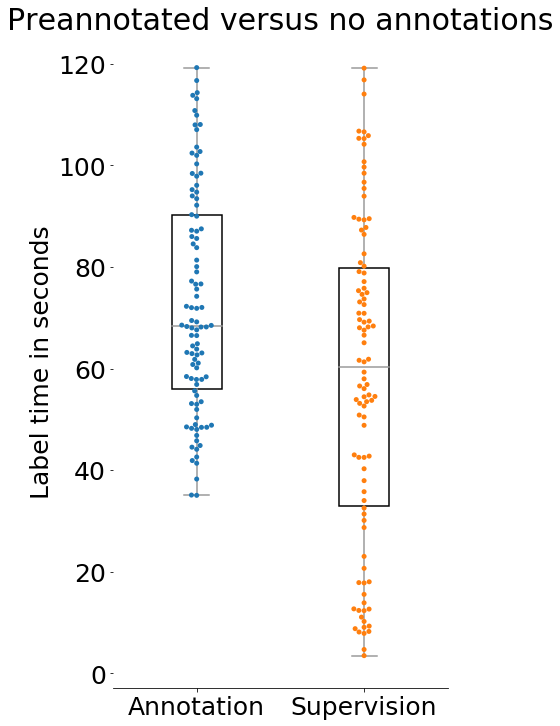

In [15]:
f, ax = plt.subplots(figsize=(6, 12))
ax = sns.boxplot(x="variable", y="value", data=time_df, width=.3, color='white', showfliers=False) 
ax = sns.swarmplot(x="variable", y="value", data=time_df)


for i,box in enumerate(ax.artists):
    box.set_edgecolor('black')
    box.set_facecolor('white')

    # iterate over whiskers and median lines
    #for j in range(6*i,6*(i+1)):
    #     ax.lines[j].set_color('black')
            
ax.set(ylabel="Label time in seconds", xlabel="", title="Preannotated versus no annotations")
sns.despine(left=True)       

In [37]:
grade = [np.median(expert.grade) for expert in results_experts_no_labels.values()]
grade_annotations = [np.median(expert.grade) for expert in results_experts_annotations.values()]

'''
grade = []
grade_annotations = []
names = []

for expert in results_experts_no_labels.values():
    grade += expert.grade
    names += [expert.project_name for i in range(len(expert.grade))]

for expert in results_experts_annotations.values():
    grade_annotations += expert.grade
    names += [expert.project_name for i in range(len(expert.grade))]
'''


'\ngrade = []\ngrade_annotations = []\nnames = []\n\nfor expert in results_experts_no_labels.values():\n    grade += expert.grade\n    names += [expert.project_name for i in range(len(expert.grade))]\n\nfor expert in results_experts_annotations.values():\n    grade_annotations += expert.grade\n    names += [expert.project_name for i in range(len(expert.grade))]\n'

In [40]:
grade_df = pd.DataFrame()
grade_df['variable'] = ["Annotation" for i in grade] + ["Supervision" for i in grade_annotations]
grade_df['value'] = grade + grade_annotations
#grade_df['names']= names

grade_df

,variable,value
0,Annotation,1.888889
1,Annotation,1.679487
2,Annotation,1.414286
3,Annotation,1.577778
4,Annotation,1.522727
5,Annotation,1.414286
6,Annotation,1.356250
7,Supervision,1.440972
8,Supervision,1.651515
9,Supervision,1.655303


In [41]:
gt_grade = np.mean(ground_truth.grade)
gt_grade

1.2911441336441336

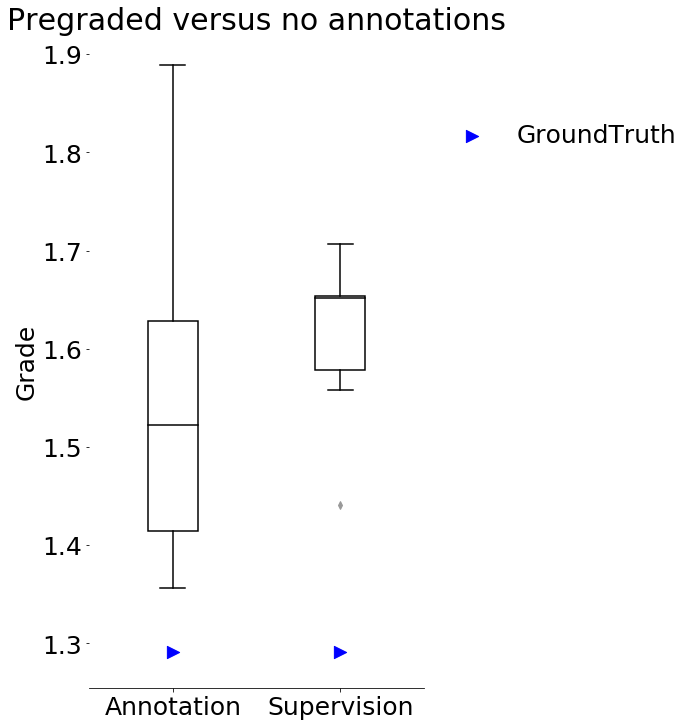

In [42]:
f, ax = plt.subplots(figsize=(6, 12))
ax = sns.boxplot(x="variable", y="value", data=grade_df, width=.3, color='white') 

for i,box in enumerate(ax.artists):
    box.set_edgecolor('black')
    box.set_facecolor('white')

    # iterate over whiskers and median lines
    for j in range(6*i,6*(i+1)):
         ax.lines[j].set_color('black')
            
plt.scatter(x=0, y=gt_grade, marker=">", s=150, c="b", zorder=100, label="GroundTruth")
plt.scatter(x=1, y=gt_grade, marker=">", s=150, c="b", zorder=100)

ax.legend(bbox_to_anchor=(1., 0.9), prop={'size': 25}, frameon=False)
            
ax.set(ylabel="Grade", xlabel="", title="Pregraded versus no annotations")
sns.despine(left=True)       

In [47]:
data = []

for expert in results_experts.values():
    map_class = np.median(expert.calc_map(ground_truth))
    map_ignore = np.median(expert.calc_map(ground_truth, ignore_grade=True))
    project_name = expert.project_name.split('-')[0]
    project_type =  str(expert.project_type).split('.')[1]
    temp_get, temp_pred = expert.confusion_values(ground_truth)
    acc = accuracy_score(temp_get, temp_pred)
                 
    
    data.append([map_class, map_ignore, acc, project_name, project_type])

df_map = pd.DataFrame(data, columns = ['mAP', 'mAP-IG', 'Acc', 'Name', 'Type']).sort_values(by=['Acc'])
df_map

,mAP,mAP-IG,Acc,Name,Type
8,0.404527,0.793424,0.630000,MA,NoLabels
7,0.382921,0.861643,0.639269,SG,Labels
0,0.332585,0.593136,0.650538,PM,NoLabels
9,0.406907,0.845669,0.657277,SG,NoLabels
2,0.432806,0.828826,0.680556,MH,NoLabels
5,0.420701,0.748369,0.686364,SE,NoLabels
13,0.535094,0.873373,0.689498,CM,NoLabels
10,0.490859,0.927580,0.690265,MH,Labels
3,0.565732,0.958932,0.746725,SC,Labels
12,0.570649,0.948131,0.751092,JA,Labels


In [21]:
df_map_melt = pd.melt(df_map[['mAP', 'mAP-IG']])
df_map_melt['Type'] = [str(type) for type in list(df_map['Type'].values)] + [str(type) for type in list(df_map['Type'].values)]
df_map_melt

,variable,value,Type
0,mAP,0.404527,ProjectType.NoLabels
1,mAP,0.382921,ProjectType.Labels
2,mAP,0.332585,ProjectType.NoLabels
3,mAP,0.406907,ProjectType.NoLabels
4,mAP,0.432806,ProjectType.NoLabels
5,mAP,0.420701,ProjectType.NoLabels
6,mAP,0.535094,ProjectType.NoLabels
7,mAP,0.490859,ProjectType.Labels
8,mAP,0.565732,ProjectType.Labels
9,mAP,0.570649,ProjectType.Labels


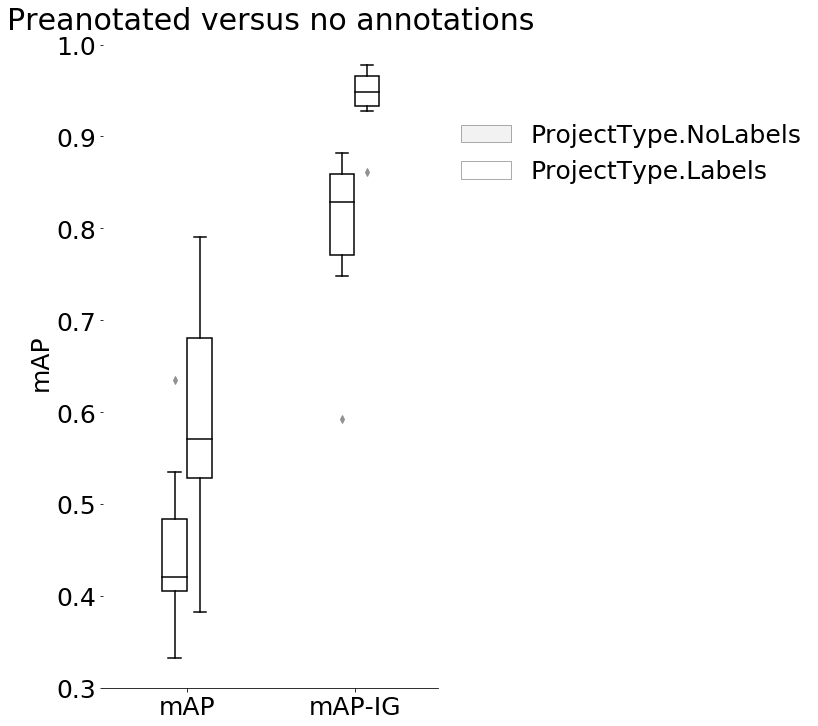

In [22]:
f, ax = plt.subplots(figsize=(6, 12))
# pd.melt(df_map[['mAP', 'mAp-IG', 'Type']])
ax = sns.boxplot(x="variable", y="value", data=df_map_melt, width=.3, color='white', hue='Type') 


for i,box in enumerate(ax.artists):
    box.set_edgecolor('black')
    box.set_facecolor('white')

    # iterate over whiskers and median lines
    for j in range(6*i,6*(i+1)):
         ax.lines[j].set_color('black')


ax.legend(bbox_to_anchor=(1., 0.9), prop={'size': 25}, frameon=False)
            
ax.set(ylabel="mAP", xlabel="", title="Preanotated versus no annotations")
sns.despine(left=True)  

In [23]:
increase_class = ['01_EIPH_563479 Turnbull blue.png', '02_EIPH_574162 Turnbull blue-001.png', \
  '04_EIPH_567017 Turnbull blue-001.png', '08_EIPH_574999 Berliner Blau.png', '13_EIPH_570370 Berliner Blau.png']

In [24]:
annotations_names = []
ratios = []

for expert in results_experts_annotations.values():
    ratios.append(expert.calc_decreased_cells_ration(ground_truth, increase_class))
    annotations_names.append(expert.project_name)

increase_class_df = pd.DataFrame()
increase_class_df['variable'] = ["Ratio" for i in ratios]
increase_class_df['value'] = ratios
increase_class_df['names']= annotations_names

increase_class_df

,variable,value,names
0,Ratio,57.142857,CB-EIPH-Labels
1,Ratio,12.500000,SC-EIPH-Labels
2,Ratio,33.928571,RK-EIPH-Labels
3,Ratio,46.428571,CM-EIPH-Labels
4,Ratio,37.037037,SG-EIPH-Labels
5,Ratio,27.777778,MH-EIPH-Labels
6,Ratio,26.785714,JA-EIPH-Labels


In [25]:
annotations_names = []
ratios_removed_boxes = []

for expert in results_experts_annotations.values():
    ratios_removed_boxes.append(expert.calc_removed_cells_ration("removed_cells.json"))
    annotations_names.append(expert.project_name)

In [26]:
removed_boxes_df = pd.DataFrame()
removed_boxes_df['variable'] = ["Ratio" for i in ratios]
removed_boxes_df['value'] = ratios_removed_boxes
removed_boxes_df['names']= annotations_names

removed_boxes_df

,variable,value,names
0,Ratio,80.0,CB-EIPH-Labels
1,Ratio,60.0,SC-EIPH-Labels
2,Ratio,60.0,RK-EIPH-Labels
3,Ratio,80.0,CM-EIPH-Labels
4,Ratio,80.0,SG-EIPH-Labels
5,Ratio,60.0,MH-EIPH-Labels
6,Ratio,80.0,JA-EIPH-Labels


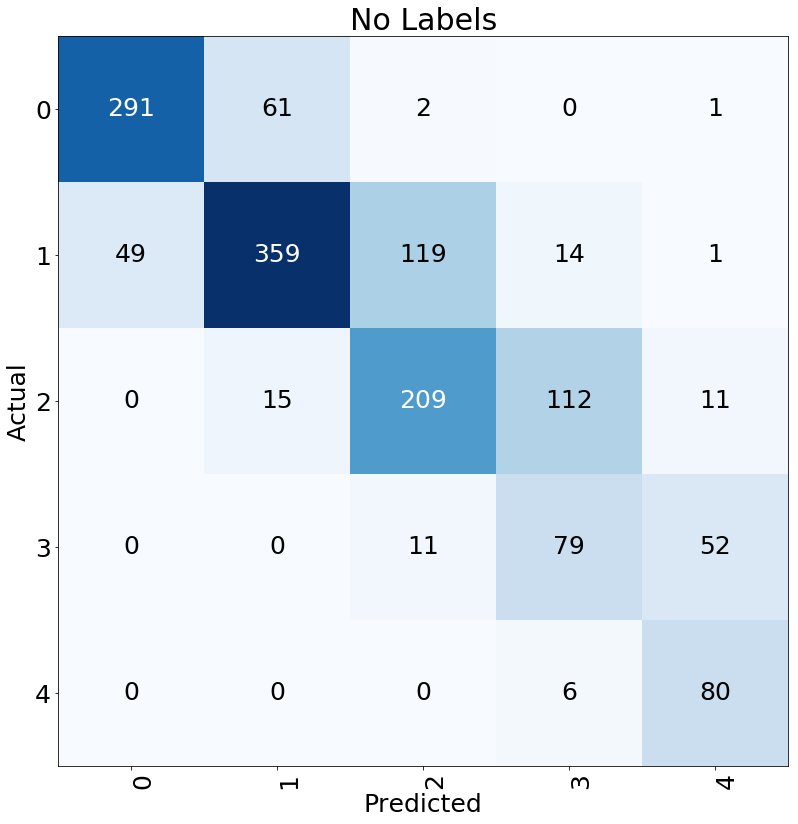

In [27]:
gt_values = []
predicted_values = []

for expert in results_experts_no_labels.values():
    
    temp_get, temp_pred = expert.confusion_values(ground_truth)

    gt_values += temp_get
    predicted_values += temp_pred
    


cm = confusion_matrix(gt_values, predicted_values)
cmap = plt.cm.Blues
fig, ax = plt.subplots(figsize=(12,12))
im = ax.imshow(cm, interpolation='nearest', cmap=cmap)


ax.set(xticks=np.arange(cm.shape[1]),
               yticks=np.arange(cm.shape[0]),
               # ... and label them with the respective list entries
               xticklabels=[0,1,2,3,4], yticklabels=[0,1,2,3,4],
               title="No Labels",
               ylabel="Actual",
               xlabel="Predicted")

plt.setp(ax.get_xticklabels(), rotation=90, ha="right",rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = 'd'#'.2f' if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                        ha="center", va="center",
                        color="white" if cm[i, j] > thresh else "black")
fig.tight_layout()

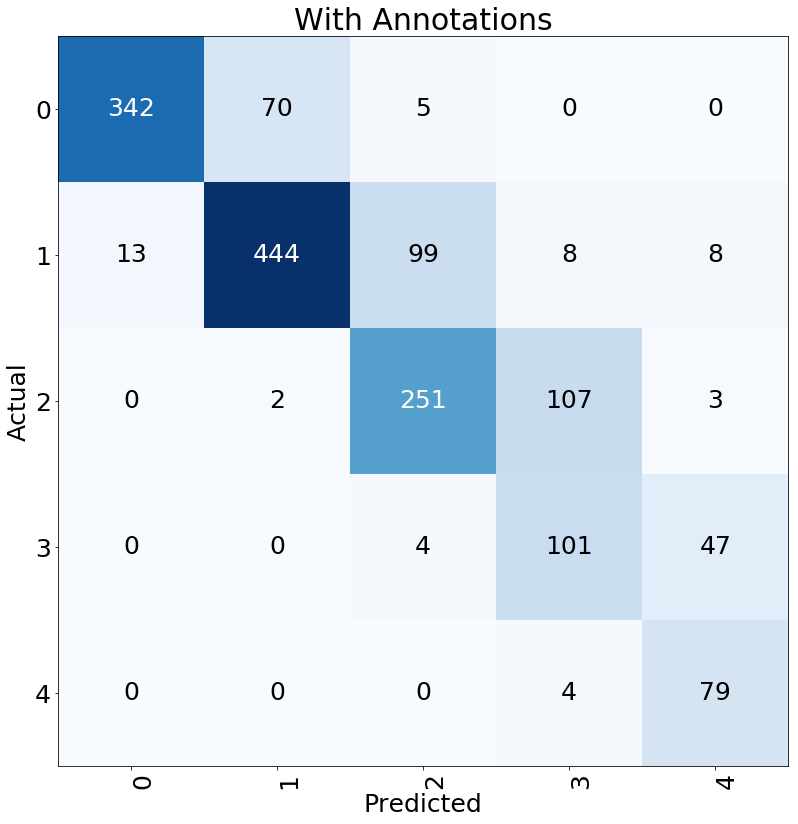

In [28]:
gt_values = []
predicted_values = []

for expert in results_experts_annotations.values():
    temp_get, temp_pred = expert.confusion_values(ground_truth)
    
    gt_values += temp_get
    predicted_values += temp_pred

cm = confusion_matrix(gt_values, predicted_values)
cmap = plt.cm.Blues
fig, ax = plt.subplots(figsize=(12,12))
im = ax.imshow(cm, interpolation='nearest', cmap=cmap)


ax.set(xticks=np.arange(cm.shape[1]),
               yticks=np.arange(cm.shape[0]),
               # ... and label them with the respective list entries
               xticklabels=[0,1,2,3,4], yticklabels=[0,1,2,3,4],
               title="With Annotations",
               ylabel="Actual",
               xlabel="Predicted")

plt.setp(ax.get_xticklabels(), rotation=90, ha="right",rotation_mode="anchor")

# Loop over data dimensions and create text annotations.
fmt = 'd'#'.2f' if normalize else 'd'
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], fmt),
                        ha="center", va="center",
                        color="white" if cm[i, j] > thresh else "black")
fig.tight_layout()

In [29]:
from matplotlib.pyplot import figure

images_folder = Path("/server/born_pix_cm/EIPH_WSI/Studie/")

image_names = []
expert_images = {}
for expert in results_experts.values():
    expert_images[expert.project_name] = expert.drawAllBoundingBoxes(ground_truth, images_folder)
    image_names = list(expert.images.keys())    

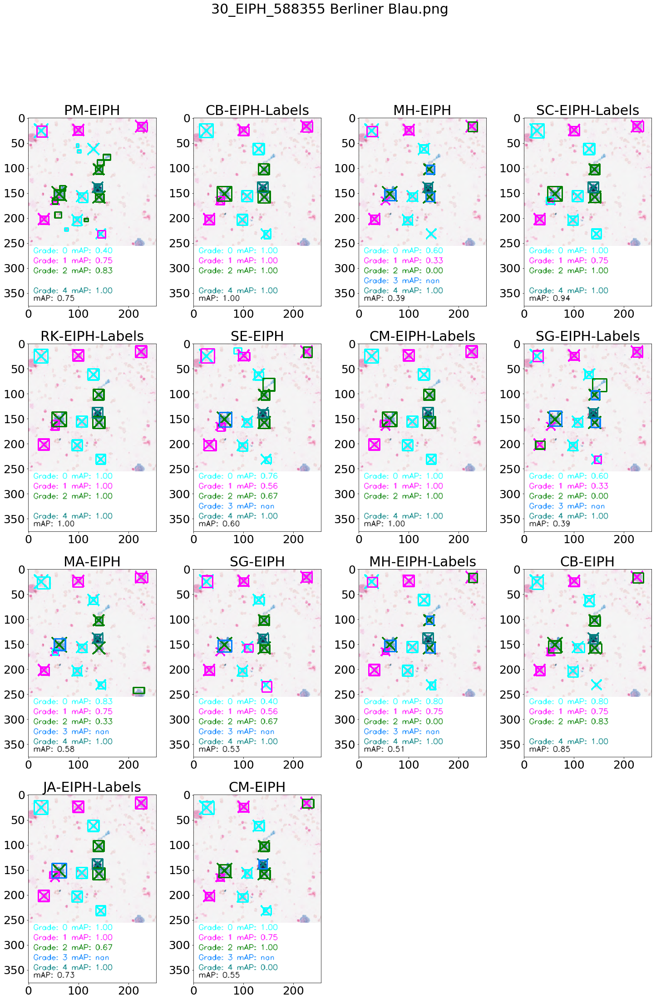

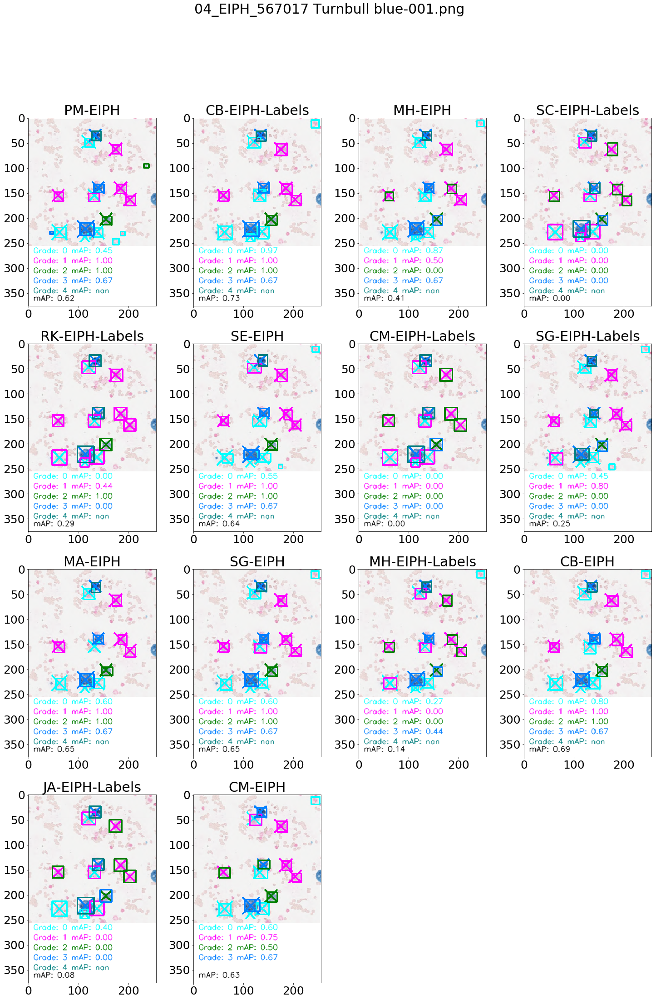

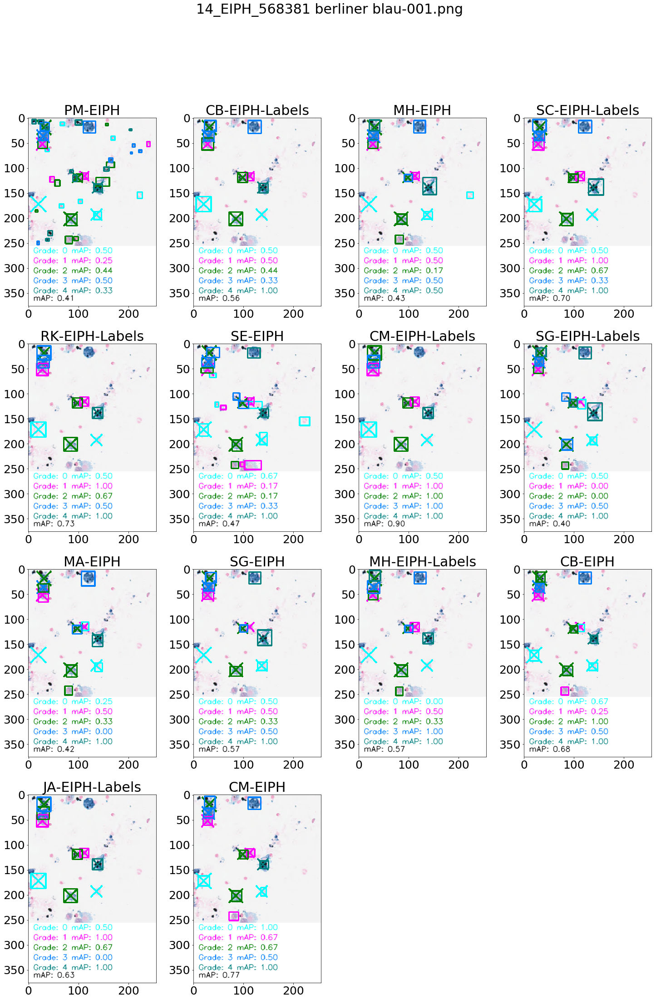

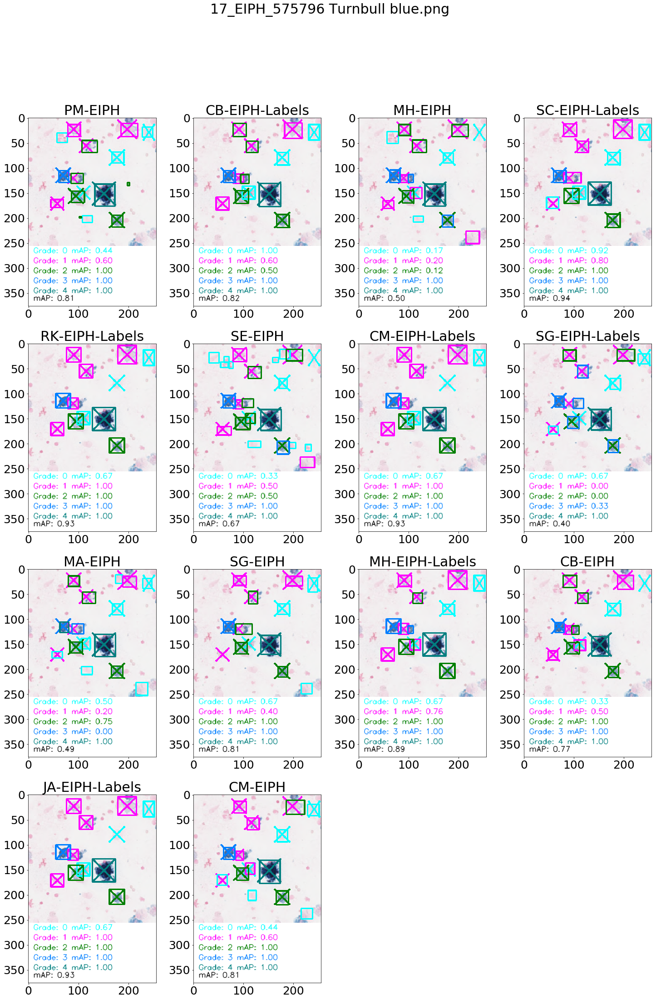

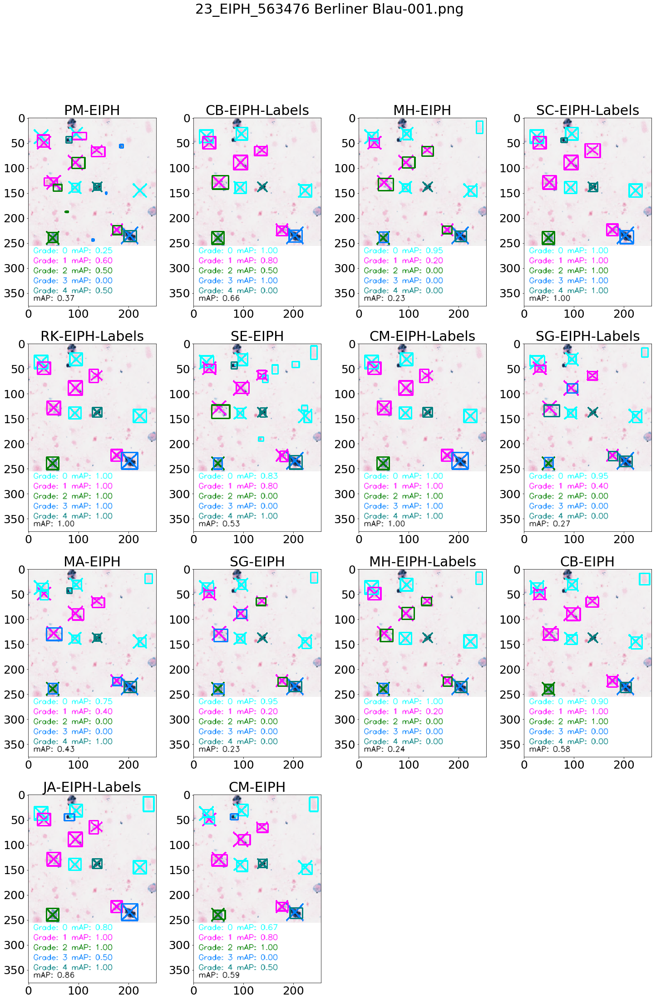

...

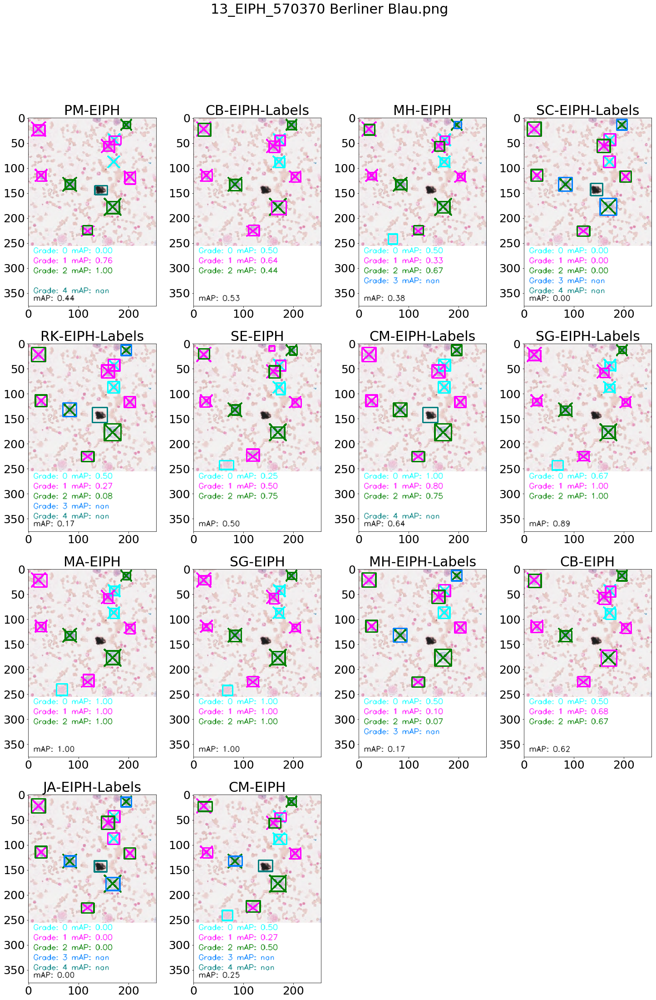

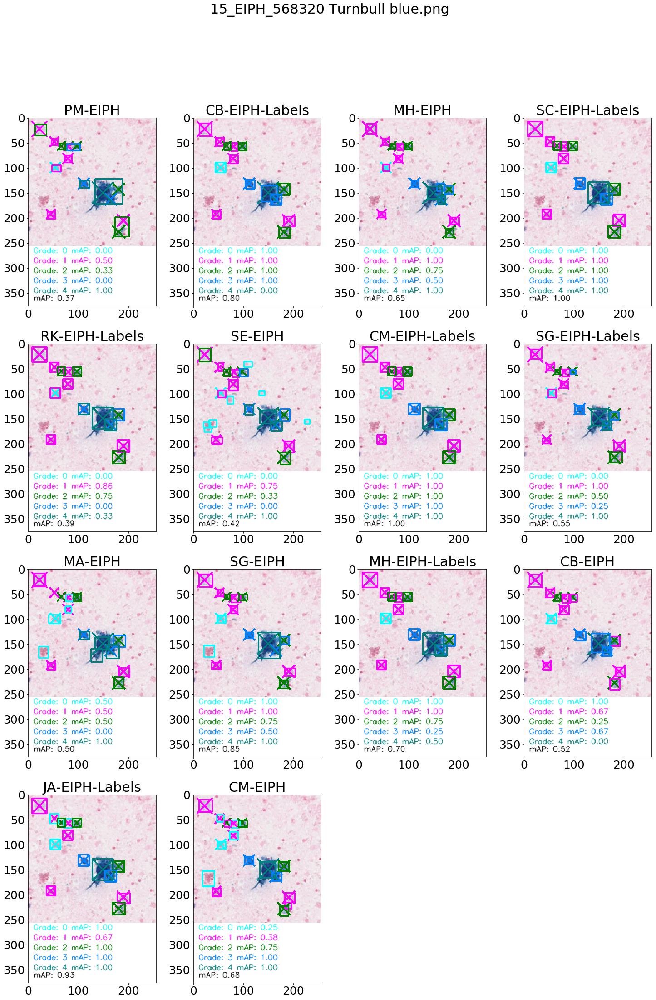

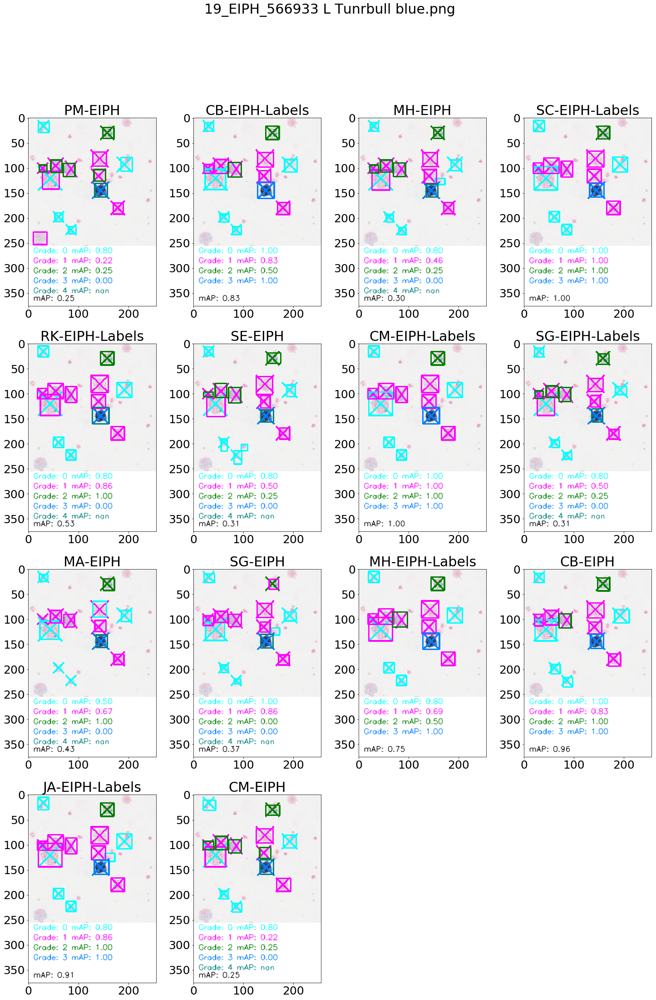

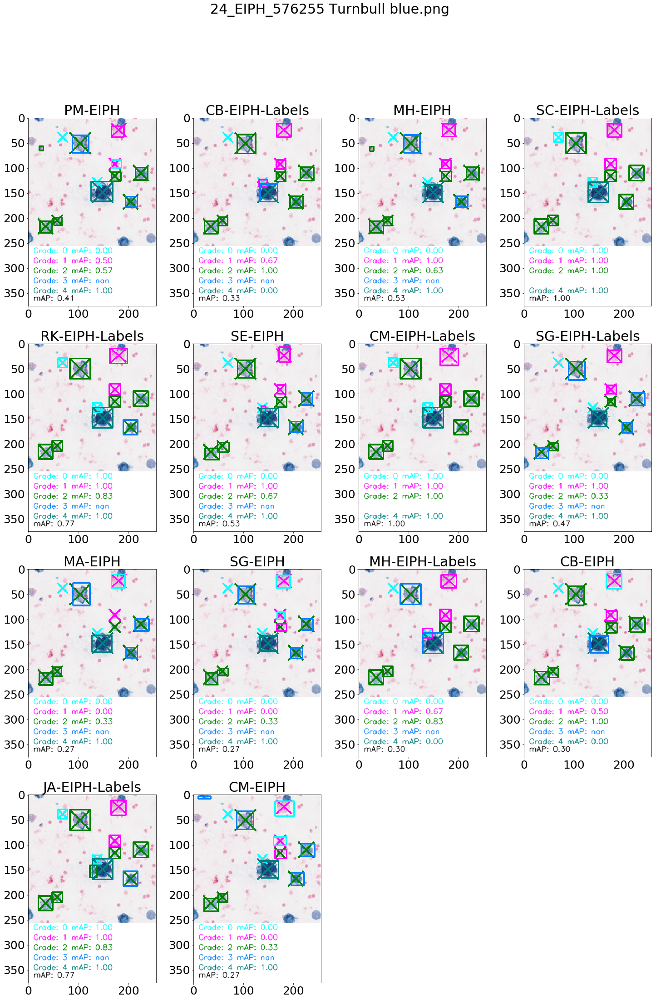

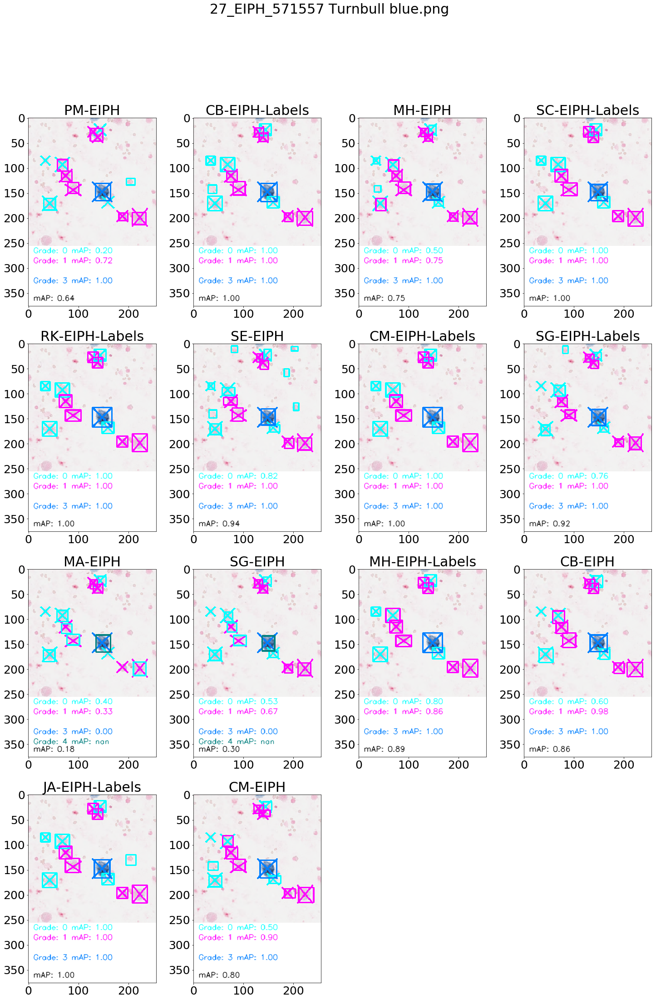

In [30]:
columns = ceil(sqrt(len(results_experts)))
rows = ceil(sqrt(len(results_experts)))

for image_id in image_names:
    
    fig = plt.figure(figsize=(25, 35))
    fig.suptitle(image_id)
    
    for i, expert_id in enumerate(results_experts):
        image = expert_images[expert_id][image_id]
        ax = fig.add_subplot(rows, columns, i+1)
        ax.title.set_text(expert_id)
        plt.imshow(image)
        
    plt.show()
    